In [320]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
import statsmodels.api as sm

%matplotlib inline


In [332]:
data_train = pd.read_csv("D:\Data scientist\Dataset\house-prices-advanced-regression-techniques\house_train.csv")

In [49]:
data_train.shape

(1460, 81)

In [129]:
data_train.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [130]:
data_train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [11]:
data_train.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [88]:

pd.set_option('display.max_rows', 2000)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [133]:
data_train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [333]:
data_test = pd.read_csv("D:\Data scientist\Dataset\house-prices-advanced-regression-techniques\house_test.csv")

In [149]:
data_test.shape

(1459, 80)

In [41]:
data_test.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [282]:
data = pd.concat([data_train,data_test],axis=0)

In [145]:
data.shape

(2919, 81)

In [65]:
data.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            4
LotFrontage       486
LotArea             0
Street              0
Alley            2721
LotShape            0
LandContour         0
Utilities           2
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         1
Exterior2nd         1
MasVnrType         24
MasVnrArea         23
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           81
BsmtCond           82
BsmtExposure       82
BsmtFinType1       79
BsmtFinSF1          1
BsmtFinType2       80
BsmtFinSF2          1
BsmtUnfSF           1
TotalBsmtSF         1
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [140]:
data.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1       float64
BsmtFinType2      object
BsmtFinSF2       float64
BsmtUnfSF        float64
TotalBsmtSF      float64
Heating           object


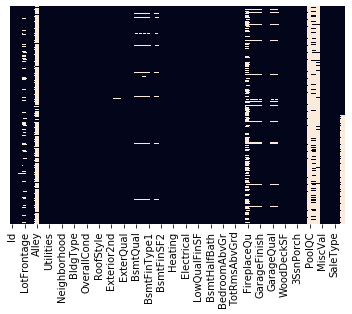

In [142]:
sns.heatmap(data.isnull(),yticklabels=False,cbar=False)

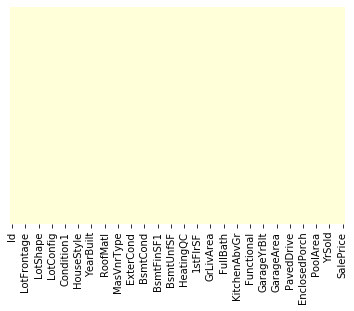

In [80]:
sns.heatmap(data.isnull(),yticklabels=False,cbar=False,cmap='YlGnBu')

In [283]:
data['LotFrontage'] = data['LotFrontage'].fillna(data['LotFrontage'].mean())

In [284]:
data.drop(["Alley","PoolQC","Fence","MiscFeature","FireplaceQu"],axis=1,inplace=True)

In [285]:
data['GarageYrBlt'] = data['GarageYrBlt'].fillna(data['GarageYrBlt'].mean())

In [286]:
data['GarageType'] = data['GarageType'].fillna(data['GarageType'].mode()[0])
data['GarageFinish'] = data['GarageFinish'].fillna(data['GarageFinish'].mode()[0])
data['GarageQual'] = data['GarageQual'].fillna(data['GarageQual'].mode()[0])
data['GarageCond'] = data['GarageCond'].fillna(data['GarageCond'].mode()[0])

In [287]:
data['BsmtQual'] = data['BsmtQual'].fillna(data['BsmtQual'].mode()[0])
data['BsmtCond'] = data['BsmtCond'].fillna(data['BsmtCond'].mode()[0])
data['BsmtExposure'] = data['BsmtExposure'].fillna(data['BsmtExposure'].mode()[0])
data['BsmtFinType1'] = data['BsmtFinType1'].fillna(data['BsmtFinType1'].mode()[0])
data['BsmtFinType2'] = data['BsmtFinType2'].fillna(data['BsmtFinType2'].mode()[0])



In [288]:
data['MasVnrType'] = data['MasVnrType'].fillna(data['MasVnrType'].mode()[0])
data['MasVnrArea'] = data['MasVnrArea'].fillna(data['MasVnrArea'].mean())

In [289]:
data['MSZoning'] = data['MSZoning'].fillna(data['MSZoning'].mode()[0])

KeyError: "['BsmtUnfSF', 'LowQualFinSF', 'MiscVal', 'OverallCond', 'HalfBath', 'YrSold', 'LotArea', 'EnclosedPorch', 'BedroomAbvGr', 'MoSold', 'BsmtFinSF2', 'Id', 'BsmtFullBath', '3SsnPorch', 'MSSubClass', 'BsmtHalfBath', 'PoolArea', 'ScreenPorch', 'KitchenAbvGr'] not in index"

In [168]:
X.shape

(1460, 37)

In [332]:
#data['SalePrice'] = data['SalePrice'].fillna(0)
#data.dropna(inplace=True)

#data_col= data.iloc[:1460,:]
#data_label = data.iloc[1460:,]

In [336]:
#data['SalePrice'] = data['SalePrice'].replace({0: np.nan})
#data_col.dropna(inplace=True)

C:\Users\Bhavesh\Miniconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [341]:
#data_col = data.iloc[:1460,:-1]
#data_label = data.iloc[1460:,-1]

#data_label['SalePrice'] = data_label['SalePrice'].fillna(0)

#data_label['SalePrice'] = data['SalePrice'].replace({0: np.nan})

C:\Users\Bhavesh\Miniconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [345]:
data_label.dropna(inplace=True)

C:\Users\Bhavesh\Miniconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [385]:
#data_col.shape

(1459, 76)

In [348]:
#data_label['SalePrice'] = data_label['SalePrice'].replace({0: np.nan})

C:\Users\Bhavesh\Miniconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [350]:
#data = pd.concat([data_col,data_label],axis=0)

In [425]:
data.shape

(2919, 76)

In [293]:
columns1 = [feature for feature in data.columns if data[feature].dtypes == "O"]
    

In [294]:
len(columns1)

38

In [295]:
data_trial = data.copy() 

In [296]:
def category_one_hot_encode(columns_list):
    trial_data = data_trial
    for feature in columns_list:
        
        feat_dummy= pd.get_dummies(trial_data[feature],drop_first=True)
        trial_data = pd.concat([trial_data,feat_dummy],axis=1)
        trial_data.drop([feature],axis=1,inplace=True)
    return trial_data

In [297]:
df=category_one_hot_encode(columns1)

In [298]:
df.drop(['Id'],inplace=True,axis=1)

KeyError: "['Id'] not found in axis"

In [301]:
df.shape

(2919, 159)

In [300]:
df=df.loc[:,~df.columns.duplicated()]

In [409]:
df.head(2000)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,FV,RH,RL,RM,Pave,IR2,IR3,Reg,HLS,Low,Lvl,NoSeWa,CulDSac,FR2,FR3,Inside,Mod,Sev,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Feedr,Norm,PosA,PosN,RRAe,RRAn,RRNe,RRNn,2fmCon,Duplex,Twnhs,TwnhsE,1.5Unf,1Story,2.5Fin,2.5Unf,2Story,SFoyer,SLvl,Gable,Gambrel,Hip,Mansard,Shed,CompShg,Membran,Metal,Roll,Tar&Grv,WdShake,WdShngl,AsphShn,BrkComm,BrkFace,CBlock,CemntBd,HdBoard,ImStucc,MetalSd,Plywood,Stone,Stucco,VinylSd,Wd Sdng,WdShing,Brk Cmn,CmentBd,Other,Wd Shng,None,Fa,Gd,TA,Po,PConc,Slab,Wood,Mn,No,BLQ,GLQ,LwQ,Rec,Unf,GasA,GasW,Grav,OthW,Wall,Y,FuseF,FuseP,Mix,SBrkr,Maj2,Min1,Min2,Typ,Attchd,Basment,BuiltIn,CarPort,Detchd,RFn,P,CWD,Con,ConLD,ConLI,ConLw,New,Oth,WD,AdjLand,Alloca,Family,Normal,Partial
0,60,65.000000,8450,7,5,2003,2003,196.000000,706.0,0.0,150.0,856.0,856,854,0,1710,1.0,0.0,2,1,3,1,8,0,2003.000000,2.0,548.0,0,61,0,0,0,0,0,2,2008,208500.0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,20,80.000000,9600,6,8,1976,1976,0.000000,978.0,0.0,284.0,1262.0,1262,0,0,1262,0.0,1.0,2,0,3,1,6,1,1976.000000,2.0,460.0,298,0,0,0,0,0,0,5,2007,181500.0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,60,68.000000,11250,7,5,2001,2002,162.000000,486.0,0.0,434.0,920.0,920,866,0,1786,1.0,0.0,2,1,3,1,6,1,2001.000000,2.0,608.0,0,42,0,0,0,0,0,9,2008,223500.0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
3,70,60.000000,9550,7,5,1915,1970,0.000000,216.0,0.0,540.0,756.0,961,756,0,1717,1.0,0.0,1,0,3,1,7,1,1998.000000,3.0,642.0,0,35,272,0,0,0,0,2,2006,140000.0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,60,84.000000,14260,8,5,2000,2000,350.000000,655.0,0.0,490.0,1145.0,1145,1053,0,2198,1.0,0.0,2,1,4,1,9,1,2000.000000,3.0,836.0,192,84,0,0,0,0,0,12,2008,250000.0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
5,50,85.000000,14115,5,5,1993,1995,0.000000,732.0,0.0,64.0,796.0,796,566,0,1362,1.0,0.0,1,1,1,1,5,0,1993.000000,2.0,480.0,40,30,0,320,0,0,700,10,2009,143000.0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
6,20,75.000000,10084,8,5,2004,2005,186.000000,1369.0,0.0,317.0,1686.0,1694,0,0,1694,1.0,0.0,2,0,3,1,7,1,2004.000000,2.0,636.0,255,57,0

In [302]:
new_train = df.iloc[:1460,:]
new_test = df.iloc[1460:,:]



In [222]:
new_train.head(10)


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,FV,RH,RL,RM,Pave,IR2,IR3,Reg,HLS,Low,Lvl,NoSeWa,CulDSac,FR2,FR3,Inside,Mod,Sev,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Feedr,Norm,PosA,PosN,RRAe,RRAn,RRNe,RRNn,2fmCon,Duplex,Twnhs,TwnhsE,1.5Unf,1Story,2.5Fin,2.5Unf,2Story,SFoyer,SLvl,Gable,Gambrel,Hip,Mansard,Shed,CompShg,Membran,Metal,Roll,Tar&Grv,WdShake,WdShngl,AsphShn,BrkComm,BrkFace,CBlock,CemntBd,HdBoard,ImStucc,MetalSd,Plywood,Stone,Stucco,VinylSd,Wd Sdng,WdShing,Brk Cmn,CmentBd,Other,Wd Shng,None,Fa,Gd,TA,Po,PConc,Slab,Wood,Mn,No,BLQ,GLQ,LwQ,Rec,Unf,GasA,GasW,Grav,OthW,Wall,Y,FuseF,FuseP,Mix,SBrkr,Maj2,Min1,Min2,Typ,Attchd,Basment,BuiltIn,CarPort,Detchd,RFn,P,CWD,Con,ConLD,ConLI,ConLw,New,Oth,WD,AdjLand,Alloca,Family,Normal,Partial
0,0.235294,0.150685,0.033420,0.666667,0.500,0.949275,0.883333,0.12250,0.125089,0.00000,0.064212,0.140098,0.119780,0.413559,0.0,0.259231,0.333333,0.0,0.666667,0.5,0.375,0.333333,0.500000,0.000000,0.936364,0.50,0.386460,0.000000,0.111517,0.000000,0.000000,0.0,0.0,0.000000,0.090909,0.50,208500.0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,0.000000,0.202055,0.038795,0.555556,0.875,0.753623,0.433333,0.00000,0.173281,0.00000,0.121575,0.206547,0.212942,0.000000,0.0,0.174830,0.000000,0.5,0.666667,0.0,0.375,0.333333,0.333333,0.333333,0.690909,0.50,0.324401,0.347725,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.363636,0.25,181500.0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,0.235294,0.160959,0.046507,0.666667,0.500,0.934783,0.866667,0.10125,0.086109,0.00000,0.185788,0.150573,0.134465,0.419370,0.0,0.273549,0.333333,0.0,0.666667,0.5,0.375,0.333333,0.333333,0.333333,0.918182,0.50,0.428773,0.000000,0.076782,0.000000,0.000000,0.0,0.0,0.000000,0.727273,0.50,223500.0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
3,0.294118,0.133562,0.038561,0.666667,0.500,0.311594,0.333333,0.00000,0.038271,0.00000,0.231164,0.123732,0.143873,0.366102,0.0,0.260550,0.333333,0.0,0.333333,0.0,0.375,0.333333,0.416667,0.333333,0.890909,0.75,0.452750,0.000000,0.063985,0.492754,0.000000,0.0,0.0,0.000000,0.090909,0.00,140000.0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,0.235294,0.215753,0.060576,0.777778,0.500,0.927536,0.833333,0.21875,0.116052,0.00000,0.209760,0.187398,0.186095,0.509927,0.0,0.351168,0.333333,0.0,0.666667,0.5,0.500,0.333333,0.583333,0.333333,0.909091,0.75,0.589563,0.224037,0.153565,0.000000,0.000000,0.0,0.0,0.000000,1.000000,0.50,250000.0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [303]:
#X = df.loc[:,:-1]
#Y = df.iloc[:,-1]
X = new_train.drop(['SalePrice'],axis=1)
Y = new_train['SalePrice']


#X_TRAIN,X_TEST,Y_TRAIN,Y_TEST =  train_test_split(X,Y,random_state=10 , test_size=0.2)

In [304]:
new_test.drop(['SalePrice'],axis=1,inplace=True)

C:\Users\Bhavesh\Miniconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [457]:
new_test.head(3)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,FV,RH,RL,RM,Pave,IR2,IR3,Reg,HLS,Low,Lvl,NoSeWa,CulDSac,FR2,FR3,Inside,Mod,Sev,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Feedr,Norm,PosA,PosN,RRAe,RRAn,RRNe,RRNn,2fmCon,Duplex,Twnhs,TwnhsE,1.5Unf,1Story,2.5Fin,2.5Unf,2Story,SFoyer,SLvl,Gable,Gambrel,Hip,Mansard,Shed,CompShg,Membran,Metal,Roll,Tar&Grv,WdShake,WdShngl,AsphShn,BrkComm,BrkFace,CBlock,CemntBd,HdBoard,ImStucc,MetalSd,Plywood,Stone,Stucco,VinylSd,Wd Sdng,WdShing,Brk Cmn,CmentBd,Other,Wd Shng,None,Fa,Gd,TA,Po,PConc,Slab,Wood,Mn,No,BLQ,GLQ,LwQ,Rec,Unf,GasA,GasW,Grav,OthW,Wall,Y,FuseF,FuseP,Mix,SBrkr,Maj2,Min1,Min2,Typ,Attchd,Basment,BuiltIn,CarPort,Detchd,RFn,P,CWD,Con,ConLD,ConLI,ConLw,New,Oth,WD,AdjLand,Alloca,Family,Normal,Partial
0,20,80.0,11622,5,6,1961,1961,0.0,468.0,144.0,270.0,882.0,896,0,0,896,0.0,0.0,1,0,2,1,5,0,1961.0,1.0,730.0,140,0,0,0,120,0,0,6,2010,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,20,81.0,14267,6,6,1958,1958,108.0,923.0,0.0,406.0,1329.0,1329,0,0,1329,0.0,0.0,1,1,3,1,6,0,1958.0,1.0,312.0,393,36,0,0,0,0,12500,6,2010,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,60,74.0,13830,5,5,1997,1998,0.0,791.0,0.0,137.0,928.0,928,701,0,1629,0.0,0.0,2,1,3,1,6,1,1997.0,2.0,482.0,212,34,0,0,0,0,0,3,2010,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0


In [499]:
Y_TRAIN.shape

(584, 176)

In [458]:
new_test.shape

(1459, 176)

In [459]:
x_train = new_train.drop(['SalePrice'],axis=1)
y_train = new_train['SalePrice']

In [542]:
import xgboost
classifier = xgboost.XGBRegressor()
classifier.fit(X,Y)

[19:47:11] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [475]:
import pickle
filename = 'finalised_model.pkl'
pickle.dump(classifier,open(filename,'wb'))

In [544]:
y_pred = classifier.predict(X_TEST)

In [545]:
pred = pd.DataFrame(y_pred)


In [483]:
y_test= pd.read_csv("D:\Data scientist\Dataset\house-prices-advanced-regression-techniques\sample_submission1.csv")
datasets = pd.concat([y_test['Id'],pred],axis=1)
datasets.columns=['Id','SalePrice']
datasets.to_csv('D:\Data scientist\Dataset\house-prices-advanced-regression-techniques\sample_submission.csv',index=False)

In [485]:
y_test.drop(['Id'],inplace=True,axis=1)

In [525]:
y_pred,shape


NameError: name 'shape' is not defined

In [469]:
y_test = np.log(y_test)


In [470]:
y_pred= np.log(y_pred)

In [546]:
xgboost_rmse= np.sqrt(mean_squared_error(new_test, y_pred))

ValueError: Found input variables with inconsistent numbers of samples: [1459, 292]

In [488]:
rmse = np.sqrt(mean_squared_error(y_pred, y_test))

In [523]:
xgboost_rmse

27671.74490350366

In [490]:
rmse

72612.48233053299

### RANDOMIZED SEARCH CV

In [547]:

regressor = xgboost.XGBRegressor()


n_estimators = [100,500,900,1100,1500]
max_depth = [2,3,5,10,15]
booster = ['gbtree','gblinear']
learning_rate=[0.05,0.1,0.15,0.20]
min_child_weight=[1,2,3,4]
 
hyperparameter_grid = {'n_estimators': n_estimators,
                      'max_depth':max_depth,
                      'booster':booster,
                      'learning_rate':learning_rate,
                      'min_child_weight':min_child_weight}    


In [548]:
XGboost_random_search  =RandomizedSearchCV(estimator=regressor,param_distributions=hyperparameter_grid,cv=5,n_iter=50,scoring='neg_mean_absolute_error',n_jobs=4,verbose=5,return_train_score=True,random_state=42)

In [552]:
XGboost_random_search.fit(X,Y)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:   10.5s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:  3.4min
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:  8.2min
[Parallel(n_jobs=4)]: Done 250 out of 250 | elapsed: 17.9min finished


[20:53:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                          colsample_bylevel=1,
                                          colsample_bynode=1,
                                          colsample_bytree=1, gamma=0,
                                          importance_type='gain',
                                          learning_rate=0.1, max_delta_step=0,
                                          max_depth=3, min_child_weight=1,
                                          missing=None, n_estimators=100,
                                          n_jobs=1, nthread=None,
                                          objective='reg:linear',
                                          random_state=0, reg_alpha=...
                                          verbosity=1),
                   iid='deprecated', n_iter=50, n_jobs=4,
                   param_distributions={'booster': ['gbtree', 'gblinear'],

In [555]:
 XGboost_random_search.best_estimator_

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.05, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [554]:
 XgBoost_randomsearch_model = xgboost.XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.05, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [556]:
XgBoost_randomsearch_model.fit(x_train,y_train)

[20:55:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.05, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [557]:
ypred_randomCV = XgBoost_randomsearch_model.predict(new_test)

In [562]:
ypred_randomCV = pd.DataFrame(ypred_randomCV)
sub_df  = pd.read_csv('D:\Data scientist\Dataset\house-prices-advanced-regression-techniques\sample_submission_kaggle.csv')
datasets1 = pd.concat([sub_df['Id'],ypred_randomCV],axis=1)
datasets1.columns=['Id','SalePrice']
datasets1.to_csv('D:\Data scientist\Dataset\house-prices-advanced-regression-techniques\sample_submission.csv',index=False)

### Neural Network approach

In [305]:
import os 
os.environ['KERAS_BACKEND'] = 'theano'

In [306]:
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LeakyReLU, PReLU,ELU
from keras.layers import Dropout



#from keras.wrappers.scikit_learn import KerasClassifier
#from keras.activations import relu, sigmoid
#from sklearn.model_selection import GridSearchCV

In [309]:
Neural_model  = Sequential()

Neural_model.add(Dense(output_dim = 50, init='he_uniform',activation='relu',input_dim=158))

Neural_model.add(Dense(output_dim = 25, init='he_uniform',activation='relu'))

Neural_model.add(Dense(output_dim = 50, init='he_uniform',activation='relu'))

Neural_model.add(Dense(output_dim = 1,init ='he_uniform'))

Neural_model.compile(loss=root_mean_squared_error,optimizer='Adamax')

model_history = Neural_model.fit(X.values,Y.values,validation_split=0.20,batch_size=10,nb_epoch = 1000)


C:\Users\Bhavesh\Miniconda3\lib\site-packages\ipykernel_launcher.py:3: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=158, units=50, kernel_initializer="he_uniform")`
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Bhavesh\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=25, kernel_initializer="he_uniform")`
  """
C:\Users\Bhavesh\Miniconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=50, kernel_initializer="he_uniform")`
  import sys
C:\Users\Bhavesh\Miniconda3\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(units=1, kernel_initializer="he_uniform")`
  if __name__ == '__main__':
C:\Users\Bhavesh\Miniconda3\lib\site-packages\ipykernel_launcher.py:13: UserWar

Train on 1168 samples, validate on 292 samples
Epoch 1/1000
1168/1168 [==============================] - 1s 580us/step - loss: 167649.0329 - val_loss: 92077.9243
Epoch 2/1000
1168/1168 [==============================] - ETA: 0s - loss: 60018.552 - 0s 84us/step - loss: 56307.7169 - val_loss: 56683.2375
Epoch 3/1000
1168/1168 [==============================] - 0s 115us/step - loss: 52018.6961 - val_loss: 55366.0699
Epoch 4/1000
1168/1168 [==============================] - 0s 86us/step - loss: 49274.0149 - val_loss: 52317.5009
Epoch 5/1000
1168/1168 [==============================] - 0s 139us/step - loss: 46209.8054 - val_loss: 50384.1420
Epoch 6/1000
1168/1168 [==============================] - 0s 81us/step - loss: 43199.2376 - val_loss: 48196.3218
Epoch 7/1000
1168/1168 [==============================] - 0s 99us/step - loss: 40949.7749 - val_loss: 46962.3484
Epoch 8/1000
1168/1168 [==============================] - 0s 117us/step - loss: 39460.1080 - val_loss: 45795.6016
Epoch 9/1000
116

Epoch 72/1000
1168/1168 [==============================] - 0s 149us/step - loss: 33151.2042 - val_loss: 44673.1939
Epoch 73/1000
1168/1168 [==============================] - 0s 125us/step - loss: 33514.6155 - val_loss: 44903.8060
Epoch 74/1000
1168/1168 [==============================] - 0s 116us/step - loss: 33404.9775 - val_loss: 46731.0818
Epoch 75/1000
1168/1168 [==============================] - 0s 135us/step - loss: 33174.0894 - val_loss: 44742.9892
Epoch 76/1000
1168/1168 [==============================] - 0s 99us/step - loss: 33355.2393 - val_loss: 44603.6840
Epoch 77/1000
1168/1168 [==============================] - 0s 140us/step - loss: 32994.8765 - val_loss: 45018.7316
Epoch 78/1000
1168/1168 [==============================] - 0s 129us/step - loss: 32958.7010 - val_loss: 45071.6668
Epoch 79/1000
1168/1168 [==============================] - 0s 147us/step - loss: 32978.0172 - val_loss: 45034.0729
Epoch 80/1000
1168/1168 [==============================] - 0s 153us/step - loss: 

1168/1168 [==============================] - 0s 146us/step - loss: 27353.6931 - val_loss: 38581.5380
Epoch 213/1000
1168/1168 [==============================] - 0s 120us/step - loss: 27138.3167 - val_loss: 38513.1835
Epoch 214/1000
1168/1168 [==============================] - 0s 147us/step - loss: 27071.0994 - val_loss: 39518.3681
Epoch 215/1000
1168/1168 [==============================] - 0s 134us/step - loss: 26771.1823 - val_loss: 39634.5397
Epoch 216/1000
1168/1168 [==============================] - 0s 118us/step - loss: 27298.6869 - val_loss: 38097.0399
Epoch 217/1000
1168/1168 [==============================] - 0s 123us/step - loss: 26840.9278 - val_loss: 38250.5409
Epoch 218/1000
1168/1168 [==============================] - 0s 141us/step - loss: 26932.6360 - val_loss: 38611.6661
Epoch 219/1000
1168/1168 [==============================] - 0s 134us/step - loss: 26709.0229 - val_loss: 38055.1683
Epoch 220/1000
1168/1168 [==============================] - 0s 121us/step - loss: 26789

Epoch 283/1000
1168/1168 [==============================] - 0s 127us/step - loss: 25279.7830 - val_loss: 35199.2752
Epoch 284/1000
1168/1168 [==============================] - 0s 154us/step - loss: 25859.8934 - val_loss: 35625.9791
Epoch 285/1000
1168/1168 [==============================] - 0s 163us/step - loss: 24993.7358 - val_loss: 35757.2362
Epoch 286/1000
1168/1168 [==============================] - 0s 127us/step - loss: 24936.2173 - val_loss: 35687.4324
Epoch 287/1000
1168/1168 [==============================] - 0s 103us/step - loss: 25201.5990 - val_loss: 35165.1318
Epoch 288/1000
1168/1168 [==============================] - 0s 123us/step - loss: 24850.9549 - val_loss: 35421.8451
Epoch 289/1000
1168/1168 [==============================] - 0s 122us/step - loss: 25504.1114 - val_loss: 36649.4261
Epoch 290/1000
1168/1168 [==============================] - 0s 136us/step - loss: 25067.6879 - val_loss: 35612.6505
Epoch 291/1000
1168/1168 [==============================] - 0s 128us/ste

Epoch 424/1000
1168/1168 [==============================] - 0s 135us/step - loss: 22918.3141 - val_loss: 31120.3067
Epoch 425/1000
1168/1168 [==============================] - 0s 130us/step - loss: 23180.2878 - val_loss: 32307.0258
Epoch 426/1000
1168/1168 [==============================] - 0s 122us/step - loss: 23097.3753 - val_loss: 31138.9673
Epoch 427/1000
1168/1168 [==============================] - 0s 120us/step - loss: 22498.4361 - val_loss: 33011.3579
Epoch 428/1000
1168/1168 [==============================] - 0s 160us/step - loss: 23752.4666 - val_loss: 32435.7818
Epoch 429/1000
1168/1168 [==============================] - 0s 136us/step - loss: 23091.1206 - val_loss: 30991.2489
Epoch 430/1000
1168/1168 [==============================] - 0s 108us/step - loss: 23166.8539 - val_loss: 30988.7827
Epoch 431/1000
1168/1168 [==============================] - 0s 137us/step - loss: 23033.4520 - val_loss: 30769.0039
Epoch 432/1000
1168/1168 [==============================] - 0s 123us/ste

Epoch 565/1000
1168/1168 [==============================] - 0s 130us/step - loss: 21140.2047 - val_loss: 27530.5529
Epoch 566/1000
1168/1168 [==============================] - 0s 147us/step - loss: 20605.4001 - val_loss: 29866.6758
Epoch 567/1000
1168/1168 [==============================] - 0s 137us/step - loss: 21385.7060 - val_loss: 28082.0313
Epoch 568/1000
1168/1168 [==============================] - 0s 182us/step - loss: 21486.1754 - val_loss: 28337.6136
Epoch 569/1000
1168/1168 [==============================] - 0s 133us/step - loss: 21450.1059 - val_loss: 27700.7174
Epoch 570/1000
1168/1168 [==============================] - 0s 160us/step - loss: 21542.7030 - val_loss: 27356.6241
Epoch 571/1000
1168/1168 [==============================] - 0s 150us/step - loss: 21471.4656 - val_loss: 28123.8888
Epoch 572/1000
1168/1168 [==============================] - 0s 147us/step - loss: 21087.7945 - val_loss: 27750.8097
Epoch 573/1000
1168/1168 [==============================] - 0s 159us/ste

Epoch 706/1000
1168/1168 [==============================] - 0s 129us/step - loss: 18900.6942 - val_loss: 25347.2031
Epoch 707/1000
1168/1168 [==============================] - 0s 109us/step - loss: 19510.7434 - val_loss: 25236.1972
Epoch 708/1000
1168/1168 [==============================] - 0s 152us/step - loss: 19400.4706 - val_loss: 26121.7152
Epoch 709/1000
1168/1168 [==============================] - 0s 121us/step - loss: 19018.6355 - val_loss: 24794.8895
Epoch 710/1000
1168/1168 [==============================] - 0s 146us/step - loss: 19189.4264 - val_loss: 24657.1903
Epoch 711/1000
1168/1168 [==============================] - 0s 119us/step - loss: 19807.1616 - val_loss: 24648.0148
Epoch 712/1000
1168/1168 [==============================] - 0s 135us/step - loss: 18910.1142 - val_loss: 25702.6667
Epoch 713/1000
1168/1168 [==============================] - 0s 150us/step - loss: 19266.3529 - val_loss: 25926.1915
Epoch 714/1000
1168/1168 [==============================] - 0s 117us/ste

Epoch 847/1000
1168/1168 [==============================] - 0s 147us/step - loss: 17296.7329 - val_loss: 26718.2364
Epoch 848/1000
1168/1168 [==============================] - 0s 153us/step - loss: 17745.0843 - val_loss: 28257.5909
Epoch 849/1000
1168/1168 [==============================] - 0s 138us/step - loss: 17763.7230 - val_loss: 28103.2437
Epoch 850/1000
1168/1168 [==============================] - 0s 143us/step - loss: 17661.2792 - val_loss: 27544.5776
Epoch 851/1000
1168/1168 [==============================] - 0s 155us/step - loss: 17574.3136 - val_loss: 26573.8265
Epoch 852/1000
1168/1168 [==============================] - 0s 172us/step - loss: 17668.0714 - val_loss: 27394.6014
Epoch 853/1000
1168/1168 [==============================] - 0s 188us/step - loss: 17881.3208 - val_loss: 27102.4016
Epoch 854/1000
1168/1168 [==============================] - 0s 166us/step - loss: 17499.4597 - val_loss: 26641.3227
Epoch 855/1000
1168/1168 [==============================] - 0s 156us/ste

1168/1168 [==============================] - 0s 140us/step - loss: 16945.7242 - val_loss: 28687.2022
Epoch 988/1000
1168/1168 [==============================] - 0s 138us/step - loss: 17524.7786 - val_loss: 27076.3058
Epoch 989/1000
1168/1168 [==============================] - 0s 138us/step - loss: 17104.4791 - val_loss: 27153.5437
Epoch 990/1000
1168/1168 [==============================] - 0s 125us/step - loss: 16391.5575 - val_loss: 26864.2445
Epoch 991/1000
1168/1168 [==============================] - 0s 134us/step - loss: 16928.5978 - val_loss: 27667.1193
Epoch 992/1000
1168/1168 [==============================] - 0s 123us/step - loss: 16994.8207 - val_loss: 26594.8103
Epoch 993/1000
1168/1168 [==============================] - 0s 134us/step - loss: 16456.8429 - val_loss: 28077.3490
Epoch 994/1000
1168/1168 [==============================] - 0s 122us/step - loss: 17080.6983 - val_loss: 26881.6705
Epoch 995/1000
1168/1168 [==============================] - 0s 187us/step - loss: 16875

In [310]:
ann_pred= Neural_model.predict(new_test)

In [307]:
from keras import backend as K
def root_mean_squared_error(y_true,y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

In [311]:
ypred_neural = pd.DataFrame(ann_pred)

In [312]:
y_test= pd.read_csv("D:\Data scientist\Dataset\house-prices-advanced-regression-techniques\sample_submission_default.csv")
datasets2 = pd.concat([y_test['Id'],ypred_neural],axis=1)
datasets2.columns=['Id','SalePrice']
datasets2.to_csv('D:\Data scientist\Dataset\house-prices-advanced-regression-techniques\sample_submission.csv',index=False)

### Feature Scaling


In [1]:
df.shape

NameError: name 'df' is not defined

In [6]:
numerical_features = [feature for feature in data_train.columns if data_train[feature].dtypes != 'O']

print("count of Numerical variables" , len(numerical_features))

count of Numerical variables 38


In [7]:
year_variable = [feature for feature in numerical_features if 'Yr' in feature or 'Year' in feature]
    
year_variable

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

In [ ]:
#for feature in year_variable :
#    if feature!="YrSold":
#        data = data_train.copy()
#        data[feature] = data["YrSold"]-data[feature]
        

In [8]:
discrete_variable = [ feature for feature in numerical_features if len(data_train[feature].unique()) < 25 and feature not in year_variable + ['Id']]

print("COUNT of discrete variable is {}".format(len(discrete_variable)))

COUNT of discrete variable is 17


In [150]:
discrete_variable

['MSSubClass',
 'OverallQual',
 'OverallCond',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 '3SsnPorch',
 'PoolArea',
 'MiscVal',
 'MoSold']

In [9]:
conti_variable = [ feature for feature in numerical_features if feature not in discrete_variable+year_variable+["Id"]]

print("COUNT of Conti variable is {}".format(len(conti_variable)))

COUNT of Conti variable is 16


In [10]:
conti_variable.pop()

'SalePrice'

In [11]:
len(conti_variable)


15

In [12]:
newarray = ['MSSubClass',
 'OverallQual',
 'OverallCond',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 '3SsnPorch',
 'PoolArea',
 'MiscVal',
 'MoSold','YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold','LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'GrLivArea',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 'ScreenPorch']

In [337]:
scaler_normalise=MinMaxScaler()
#stadscalr  = StandardScaler()
stadscalr.fit(data_train[newarray])

MinMaxScaler(copy=True, feature_range=(0, 1))

In [338]:
data_train[newarray] = scaler_normalise.transform(data_train[newarray])


In [339]:
data_test[newarray] = scaler_normalise.transform(data_test[newarray])


In [164]:
data_train.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,0.235294,RL,0.150685,0.033420,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,0.666667,0.500,0.949275,0.883333,Gable,CompShg,VinylSd,VinylSd,BrkFace,0.12250,Gd,TA,PConc,Gd,TA,No,GLQ,0.125089,Unf,0.00000,0.064212,0.140098,GasA,Ex,Y,SBrkr,0.119780,0.413559,0.0,0.259231,0.333333,0.0,0.666667,0.5,0.375,0.333333,Gd,0.500000,Typ,0.000000,NaN,Attchd,0.936364,RFn,0.50,0.386460,TA,TA,Y,0.000000,0.111517,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,0.000000,0.090909,0.50,WD,Normal,208500
1,2,0.000000,RL,0.202055,0.038795,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,0.555556,0.875,0.753623,0.433333,Gable,CompShg,MetalSd,MetalSd,None,0.00000,TA,TA,CBlock,Gd,TA,Gd,ALQ,0.173281,Unf,0.00000,0.121575,0.206547,GasA,Ex,Y,SBrkr,0.212942,0.000000,0.0,0.174830,0.000000,0.5,0.666667,0.0,0.375,0.333333,TA,0.333333,Typ,0.333333,TA,Attchd,0.690909,RFn,0.50,0.324401,TA,TA,Y,0.347725,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,0.000000,0.363636,0.25,WD,Normal,181500
2,3,0.235294,RL,0.160959,0.046507,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,0.666667,0.500,0.934783,0.866667,Gable,CompShg,VinylSd,VinylSd,BrkFace,0.10125,Gd,TA,PConc,Gd,TA,Mn,GLQ,0.086109,Unf,0.00000,0.185788,0.150573,GasA,Ex,Y,SBrkr,0.134465,0.419370,0.0,0.273549,0.333333,0.0,0.666667,0.5,0.375,0.333333,Gd,0.333333,Typ,0.333333,TA,Attchd,0.918182,RFn,0.50,0.428773,TA,TA,Y,0.000000,0.076782,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,0.000000,0.727273,0.50,WD,Normal,223500
3,4,0.294118,RL,0.133562,0.038561,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,0.666667,0.500,0.311594,0.333333,Gable,CompShg,Wd Sdng,Wd Shng,None,0.00000,TA,TA,BrkTil,TA,Gd,No,ALQ,0.038271,Unf,0.00000,0.231164,0.123732,GasA,Gd,Y,SBrkr,0.143873,0.366102,0.0,0.260550,0.333333,0.0,0.333333,0.0,0.375,0.333333,Gd,0.416667,Typ,0.333333,Gd,Detchd,0.890909,Unf,0.75,0.452750,TA,TA,Y,0.000000,0.063985,0.492754,0.000000,0.0,0.0,NaN,NaN,NaN,0.000000,0.090909,0.00,WD,Abnorml,140000
4,5,0.235294,RL,0.215753,0.060576,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,0.777778,0.500,0.927536,0.833333,Gable,CompShg,VinylSd,VinylSd,BrkFace,0.21875,Gd,TA,PConc,Gd,TA,Av,GLQ,0.116052,Unf,0.00000,0.209760,0.187398,GasA,Ex,Y,SBrkr,0.186095,0.509927,0.0,0.351168,0.333333,0.0,0.666667,0.5,0.500,0.333333,Gd,0.583333,Typ,0.333333,TA,Attchd,0.909091,RFn,0.75,0.589563,TA,TA,Y,0.224037,0.153565,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,0.000000,1.000000,0.50,WD,Normal,250000
5,6,0.176471,RL,0.219178,0.059899,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,0.444444,0.500,0.876812,0.750000,Gable,CompShg,VinylSd,VinylSd,None,0.00000,TA,TA,Wood,Gd,TA,No,GLQ,0.129695,Unf,0.00000,0.027397,0.130278,GasA,Ex,Y,SBrkr,0.106012,0.274092,0.0,0.193670,0.333333,0.0,0.333333,0.5,0.125,0.333333,TA,0.250000,Typ,0.000000,NaN,Attchd,0.845455,Unf,0.50,0.338505,TA,TA,Y,0.046674,0.054845,0.000000,0.629921,0.0,0.0,NaN,MnPrv,Shed,0.045161,0.818182,0.75,WD,Normal,143000
6,7,0.000000,RL,0.184932,0.041057,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,0.777778,0.500,0.956522,0.916667,Gable,CompShg,VinylSd,VinylSd,Stone,0.11625

In [313]:
abc= pd.read_csv("D:\Data scientist\Dataset\house-prices-advanced-regression-techniques\sample_submission.csv")


In [314]:
abc.isnull().sum()

Id           0
SalePrice    0
dtype: int64

### CORRELATION 

In [328]:
numerical_features = [feature for feature in data_train.columns if data_train[feature].dtypes != 'O']

print("count of Numerical variables" , len(numerical_features))

count of Numerical variables 38


In [330]:
numerical_features.pop()
len(numerical_features)



37

In [331]:
num = numerical_features

In [165]:
num

['Id',
 'MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold']

In [112]:
# For correlation
new_train_corr = data.iloc[:1460,:]
X = new_train_corr[num]
Y = new_train_corr['SalePrice']


In [115]:
num 

,0
0,Id
1,MSSubClass
2,LotFrontage
3,LotArea
4,OverallQual
5,OverallCond
6,YearBuilt
7,YearRemodAdd
8,MasVnrArea
9,BsmtFinSF1


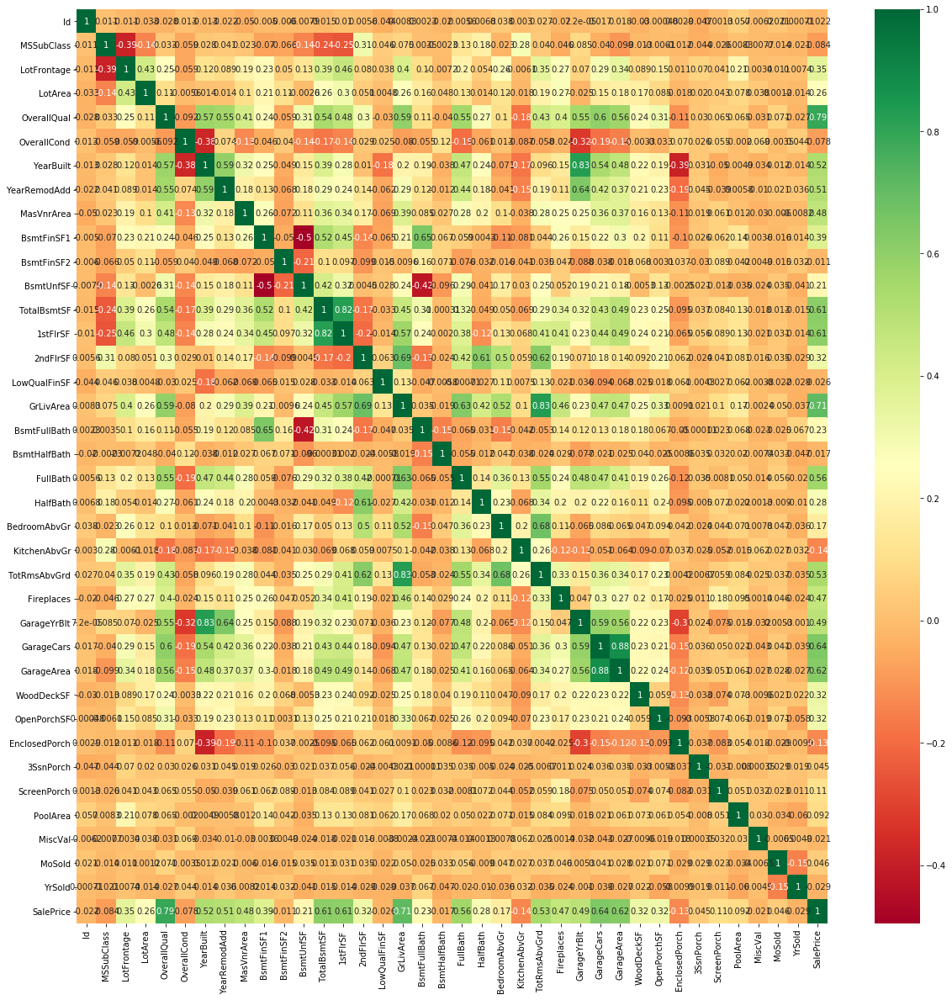

In [51]:
corr = data_train.corr()
plt.figure(figsize=(20,20))
sns.heatmap(corr,annot=True,cmap='RdYlGn')

In [240]:
best_features = SelectKBest(score_func =f_regression , k=18 )
fit = best_features.fit(X,Y)

In [265]:
featurescore2  = featurescore1.nlargest(18,'scores')
featurescore2= featurescore2.reset_index()

In [269]:
num_feat = featurescore2.iloc[:,-2].values

In [241]:
dfscore= pd.DataFrame(fit.scores_)
dfcolumns=pd.DataFrame(X.columns)

In [242]:
featurescore = pd.concat([dfscore,dfcolumns],axis=1)

In [243]:
featurescore.columns = ['scores','specs']

In [245]:
featurescore1= featurescore.set_index('specs')

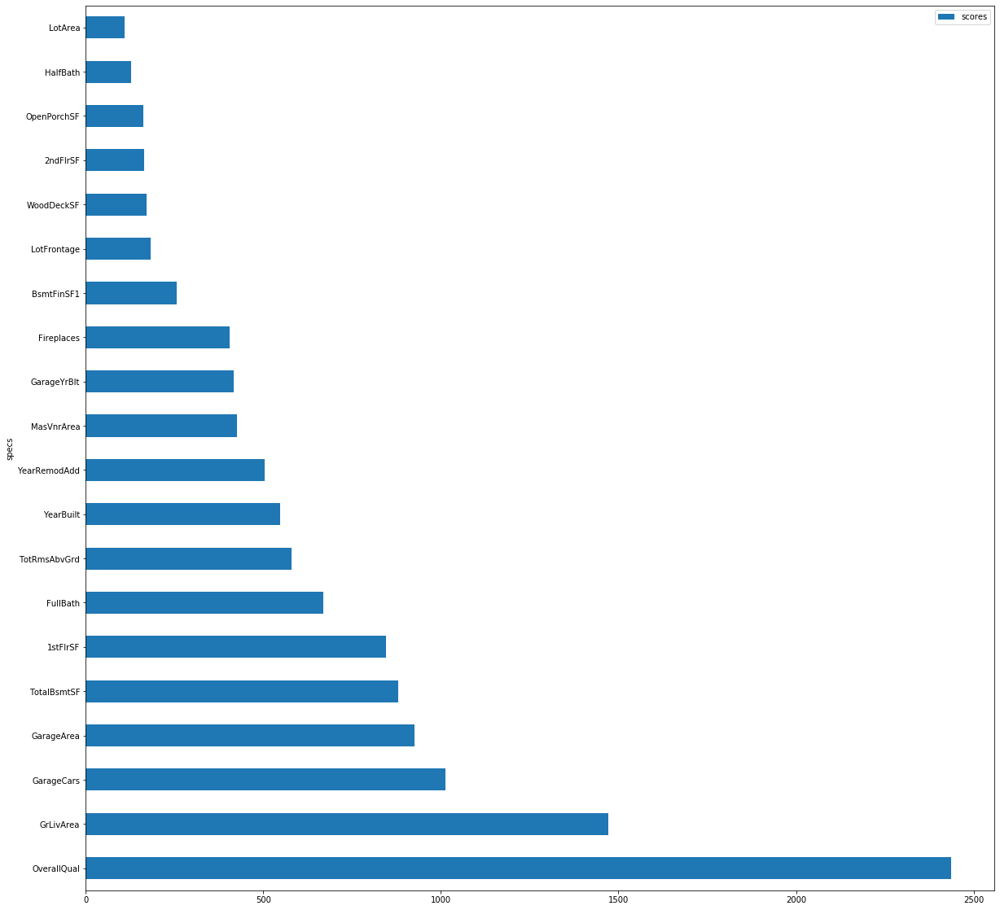

In [235]:


featurescore1.nlargest(20,'scores').plot(kind='barh',figsize=(20,20))




In [334]:
num_feat

array(['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea',
       'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt',
       'YearRemodAdd', 'MasVnrArea', 'GarageYrBlt', 'Fireplaces',
       'BsmtFinSF1', 'LotFrontage', 'WoodDeckSF', '2ndFlrSF',
       'OpenPorchSF'], dtype=object)

In [278]:
num

37

In [276]:
f = []
for feature in num:
    if feature in num_feat:
        pass
    else:
        f.append(feature)
        


In [290]:
f

['Id',
 'MSSubClass',
 'LotArea',
 'OverallCond',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold']

In [291]:
data.drop(['Id',
 'MSSubClass',
 'LotArea',
 'OverallCond',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold'],axis=1,inplace=True)

In [316]:
X.shape

(1460, 158)

In [321]:
X = sm.add_constant(X)

In [322]:
model = sm.OLS(Y,X).fit()

In [324]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.901
Model:                            OLS   Adj. R-squared:                  0.889
Method:                 Least Squares   F-statistic:                     75.07
Date:                Mon, 27 Apr 2020   Prob (F-statistic):               0.00
Time:                        13:24:49   Log-Likelihood:                -16855.
No. Observations:                1460   AIC:                         3.403e+04
Df Residuals:                    1301   BIC:                         3.487e+04
Df Model:                         158                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const          -1.6e+06    1.9e+05     -8.403      0.000   -1.97e+06   -1.23e+06
LotFrontage    116.7576     47.774      2.444      0.015      23.035     210.480
OverallQual   8875.4687   1098.085      8.083      0.000    6721.258     1.1e+04
YearBuilt      181.9043     71.560      2.542      0.011      41.518     322.291
YearRemodAdd   265.1026     53.809      4.927      0.000     159.542     370.664
MasVnrArea      12.4430      6.445      1.931      0.054      -0.200      25.086
BsmtFinSF1      22.9229      2.889      7.933      0.000      17.254      28.591
TotalBsmtSF     14.4366      4.353      3.316      0.001       5.897      22.976
1stFlrSF         3.2865     20.540      0.160      0.873     -37.008      43.581
2ndFlrSF        24.9445     19.521      1.278      0.202     -13.352      63.241
GrLivArea       45.2225     20.053      2.255      0.024       5.882      84.563
FullBath       577.0616   2196.968      0.263      0.793   -3732.926    4887.050
TotRmsAbvGrd   500.3364    931.424      0.537      0.591   -1326.921    2327.594
Fireplaces    5157.6829   1487.566      3.467      0.001    2239.392    8075.974
GarageYrBlt     30.3389     59.397      0.511      0.610     -86.186     146.864
GarageCars    3523.0596   2435.922      1.446      0.148   -1255.706    8301.825
GarageArea      14.9980      8.527      1.759      0.079      -1.731      31.727
WoodDeckSF      15.6826      6.416      2.444      0.015       3.096      28.269
OpenPorchSF     19.6172     12.554      1.563      0.118      -5.010      44.245
FV            3.573e+04   1.34e+04      2.674      0.008    9514.086    6.19e+04
RH            3.247e+04   1.34e+04      2.424      0.015    6195.062    5.87e+04
RL            3.751e+04   1.13e+04      3.314      0.001    1.53e+04    5.97e+04
RM            3.331e+04   1.06e+04      3.132      0.002    1.24e+04    5.42e+04
Pave          1.022e+04    1.3e+04      0.784      0.433   -1.54e+04    3.58e+04
IR2           1.171e+04   4656.950      2.514      0.012    2569.953    2.08e+04
IR3           1.474e+04   9756.552      1.511      0.131   -4399.584    3.39e+04
Reg            951.1127   1803.086      0.527      0.598   -2586.161    4488.387
HLS           1.557e+04   5685.819      2.738      0.006    4412.654    2.67e+04
Low            597.0584   6941.547      0.086      0.931    -1.3e+04    1.42e+04
Lvl           1.054e+04   4094.861      2.575      0.010    2509.348    1.86e+04
NoSeWa       -1.028e+04   2.91e+04     -0.353      0.724   -6.74e+04    4.68e+04
CulDSac       1.121e+04   3710.867      3.020      0.003    3928.483    1.85e+04
FR2          -6824.5593   4536.906     -1.504      0.133   -1.57e+04    2075.893
FR3          -1.624e+04   1.42e+04     -1.145      0.253   -4.41e+04    1.16e+04
Inside        -459.5219   2011.955     -0.228      0.819   -4406.552    3487.509
Mod  

In [325]:
X.corr()

,const,LotFrontage,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,FV,RH,RL,RM,Pave,IR2,IR3,Reg,HLS,Low,Lvl,NoSeWa,CulDSac,FR2,FR3,Inside,Mod,Sev,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Feedr,Norm,PosA,PosN,RRAe,RRAn,RRNe,RRNn,2fmCon,Duplex,Twnhs,TwnhsE,1.5Unf,1Story,2.5Fin,2.5Unf,2Story,SFoyer,SLvl,Gable,Gambrel,Hip,Mansard,Shed,CompShg,Membran,Metal,Roll,Tar&Grv,WdShake,WdShngl,AsphShn,BrkComm,BrkFace,CBlock,CemntBd,HdBoard,ImStucc,MetalSd,Plywood,Stone,Stucco,VinylSd,Wd Sdng,WdShing,Brk Cmn,CmentBd,Other,Wd Shng,None,Fa,Gd,TA,Po,PConc,Slab,Wood,Mn,No,BLQ,GLQ,LwQ,Rec,Unf,GasA,GasW,Grav,OthW,Wall,Y,FuseF,FuseP,Mix,SBrkr,Maj2,Min1,Min2,Typ,Attchd,Basment,BuiltIn,CarPort,Detchd,RFn,P,CWD,Con,ConLD,ConLI,ConLw,New,Oth,WD,AdjLand,Alloca,Family,Normal,Partial
const,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotFrontage,NaN,1.000000,0.234641,0.116955,0.083176,0.179112,0.214800,0.363451,0.413931,0.072418,0.368132,0.180508,0.320421,0.233967,0.064719,0.269604,0.323566,0.076000,0.137147,-0.090377,-0.043256,0.323695,-0.305864,-0.037343,0.030494,0.180186,-0.161109,0.063686,0.043481,-0.086770,-0.000728,-0.060875,-0.038748,0.001981,-0.145835,0.069460,0.021032,-0.077239,-0.231173,-0.101470,0.037851,0.021275,0.012070,-0.019871,0.064578,-0.050284,-0.183551,-0.000346,0.102819,-0.105180,0.070588,0.135535,0.126457,-0.090743,-0.060986,0.028508,0.011625,-0.054764,-0.035349,0.058919,-0.026575,0.055162,-0.077030,0.151651,0.026245,-0.028594,-0.020758,0.004600,0.031265,-0.021479,0.012722,-0.333310,-0.299585,-0.063696,0.065993,0.029774,-0.029423,0.007156,-0.076168,0.040384,-0.175581,-0.042844,0.166024,0.039438,-0.001030,-0.155139,0.003665,-0.000728,0.029823,0.099333,0.024668,0.032332,0.006043,0.001820,0.021869,0.023878,-0.076312,0.013616,0.022689,-0.118473,0.009410,0.016375,0.048742,0.075717,0.029446,-0.031180,-0.102417,-0.070241,-0.001091,-0.066107,-0.119638,0.013552,0.082675,-0.142121,-0.017738,0.056622,-0.022630,0.066326,0.031465,-0.143157,-0.004765,0.081690,-0.058137,0.030555,-0.048503,0.004984,0.010847,0.003999,-0.025093,-0.024023,0.067735,-0.028440,-0.031431,-0.011793,0.062342,-0.001379,-0.019920,0.003842,0.022857,0.173509,0.041112,0.075974,0.021479,-0.242157,0.127273,-0.012501,-0.005756,-0.030140,0.033402,0.012628,-0.051432,0.128296,-0.023187,-0.091303,-0.036702,-0.018055,0.016125,-0.073545,0.126584
OverallQual,NaN,0.234641,1.000000,0.572323,0.550684,0.410200,0.239666,0.537808,0.476224,0.295493,0.593007,0.550600,0.427452,0.396765,0.518996,0.600671,0.562022,0.238923,0.308819,0.171854,-0.064666,0.126972,-0.195515,0.058823,0.077753,0.042089,-0.199335,0.103611,-0.046563,0.017672,-0.001881,0.076027,0.012159,0.043625,-0.044691,-0.049135,-0.043725,-0.002661,-0.031355,-0.154120,-0.020882,0.132337,0.024109,-0.199925,0.079173,-0.156588,-0.127870,-0.068404,-0.228252,-0.005658,0.038075,0.224693,0.368724,-0.148731,-0.062946,-0.179215,0.033059,0.224010,0.196736,0.125168,0.039575,-0.138607,0.099223,0.028224,0.048579,-0.040634,0.024041,0.010734,0.038190,-0.123989,-0.158156,-0.003723,0.128662,-0.042654,-0.110087,0.014801,0.028116,0.279616,-0.090390,-0.027517,-0.159838,-0.040634,0.180496,-0.004986,-0.0026